In [4]:
from coactivation.process import preprocess_emgs, get_coactivation_map, get_coactivation_difference, get_all_healthy_map, get_coactivation_bool_map, get_alignment_map, array_to_cm, mirror_left_right,emgs
from coactivation.visualize import visualize_emgs, plot_coactivation_corr, plot_coactivation_map, plot_bool_map, plot_alignment_map

import pandas as pd
import numpy as np

from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, confusion_matrix

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

from matplotlib.colors import LinearSegmentedColormap

In [5]:
# generate_coactivation_csv()

# Preprocessing

In [6]:
df_raw = pd.read_csv('coactivations.csv', index_col=0)

In [7]:
df = df_raw[(df_raw.subject_id!='Augmen')]

In [8]:
df

,gt0emg0,gt0emg1,gt0emg2,gt0emg3,gt0emg4,gt0emg5,gt0emg6,gt0emg7,gt1emg0,gt1emg1,...,gt2emg2,gt2emg3,gt2emg4,gt2emg5,gt2emg6,gt2emg7,hand,is_patient,subject_id,n
0,0.018537,0.020488,0.020488,0.020488,0.021463,0.019512,0.018537,0.018537,0.026341,0.031220,...,0.074146,0.212683,0.175610,0.204878,0.191220,0.067317,left,False,fa,11
0,0.017479,0.019319,0.019319,0.018399,0.019319,0.017479,0.016559,0.017479,0.023919,0.027599,...,0.060718,0.148114,0.121435,0.101196,0.178473,0.087397,left,False,fa,11
0,0.015773,0.018139,0.021293,0.030757,0.033912,0.026025,0.017350,0.015773,0.018927,0.022871,...,0.067823,0.170347,0.143533,0.124606,0.143533,0.064274,left,False,fa,13
0,0.019231,0.023601,0.027972,0.044580,0.059441,0.043706,0.024476,0.019231,0.023601,0.027972,...,0.081294,0.198427,0.156031,0.128497,0.165210,0.086538,left,False,fa,13
0,0.041379,0.115271,0.056158,0.025616,0.026601,0.026601,0.028571,0.026601,0.073892,0.253202,...,0.141872,0.138916,0.051232,0.032512,0.040394,0.107389,right,False,xw,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.031191,0.056711,0.061437,0.026465,0.032136,0.029301,0.023629,0.022684,0.055766,0.059546,...,0.149338,0.224953,0.067108,0.040643,0.034972,0.058601,right,False,yc,13
0,0.020871,0.023593,0.019964,0.019056,0.018149,0.016334,0.016334,0.016334,0.093466,0.237750,...,0.099819,0.294011,0.058984,0.031760,0.203267,0.087114,right,False,is,11
0,0.022989,0.022031,0.022989,0.057471,0.021073,0.018199,0.017241,0.018199,0.091954,0.235632,...,0.074713,0.269157,0.052682,0.031609,0.290230,0.178161,right,False,is,11
0,0.018700,0.020481,0.028495,0.142476,0.042743,0.031167,0.026714,0.017809,0.033838,0.139804,...,0.089047,0.238646,0.076581,0.041852,0.118433,0.289403,right,False,is,13


## flip left and ae

In [9]:
df = mirror_left_right(df)
df = mirror_left_right(df, 'subject_id', 'ae')

gt0emg6       0.018537
gt0emg5       0.020488
gt0emg4       0.020488
gt0emg3       0.020488
gt0emg2       0.021463
gt0emg1       0.019512
gt0emg0       0.018537
gt0emg7       0.018537
gt1emg6       0.026341
gt1emg5        0.03122
gt1emg4       0.038049
gt1emg3       0.078049
gt1emg2        0.23122
gt1emg1       0.187317
gt1emg0       0.074146
gt1emg7       0.040976
gt2emg6       0.049756
gt2emg5       0.044878
gt2emg4       0.074146
gt2emg3       0.212683
gt2emg2        0.17561
gt2emg1       0.204878
gt2emg0        0.19122
gt2emg7       0.067317
hand              left
is_patient       False
subject_id          fa
n                   11
Name: 0, dtype: object
gt0emg6       0.017479
gt0emg5       0.019319
gt0emg4       0.019319
gt0emg3       0.018399
gt0emg2       0.019319
gt0emg1       0.017479
gt0emg0       0.016559
gt0emg7       0.017479
gt1emg6       0.023919
gt1emg5       0.027599
gt1emg4       0.034039
gt1emg3       0.068997
gt1emg2       0.175713
gt1emg1       0.148114
gt1emg0    

In [2]:
np.where(df.is_patient==True, df.subject_id, 'healthy')

NameError: name 'np' is not defined

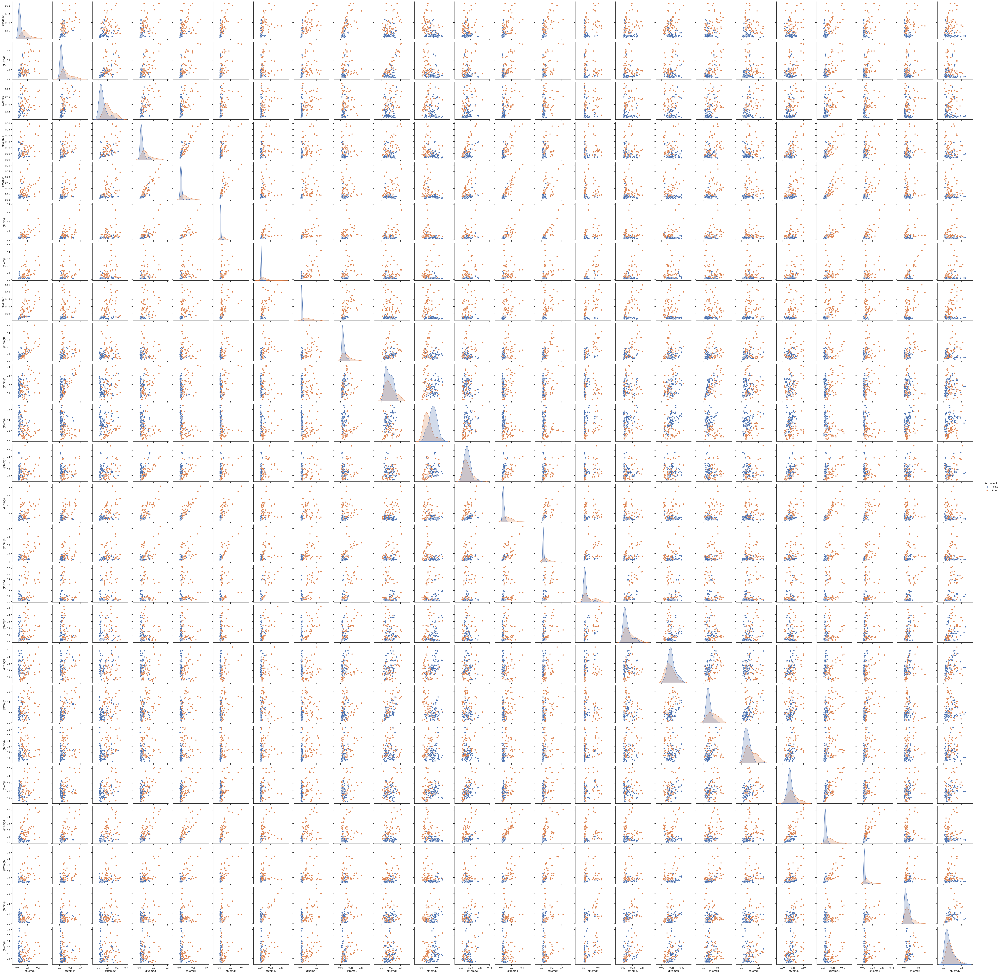

In [8]:
sns.set_theme(style="ticks")
sns.pairplot(df.iloc[:,:26].drop(columns=['hand']), hue='is_patient')

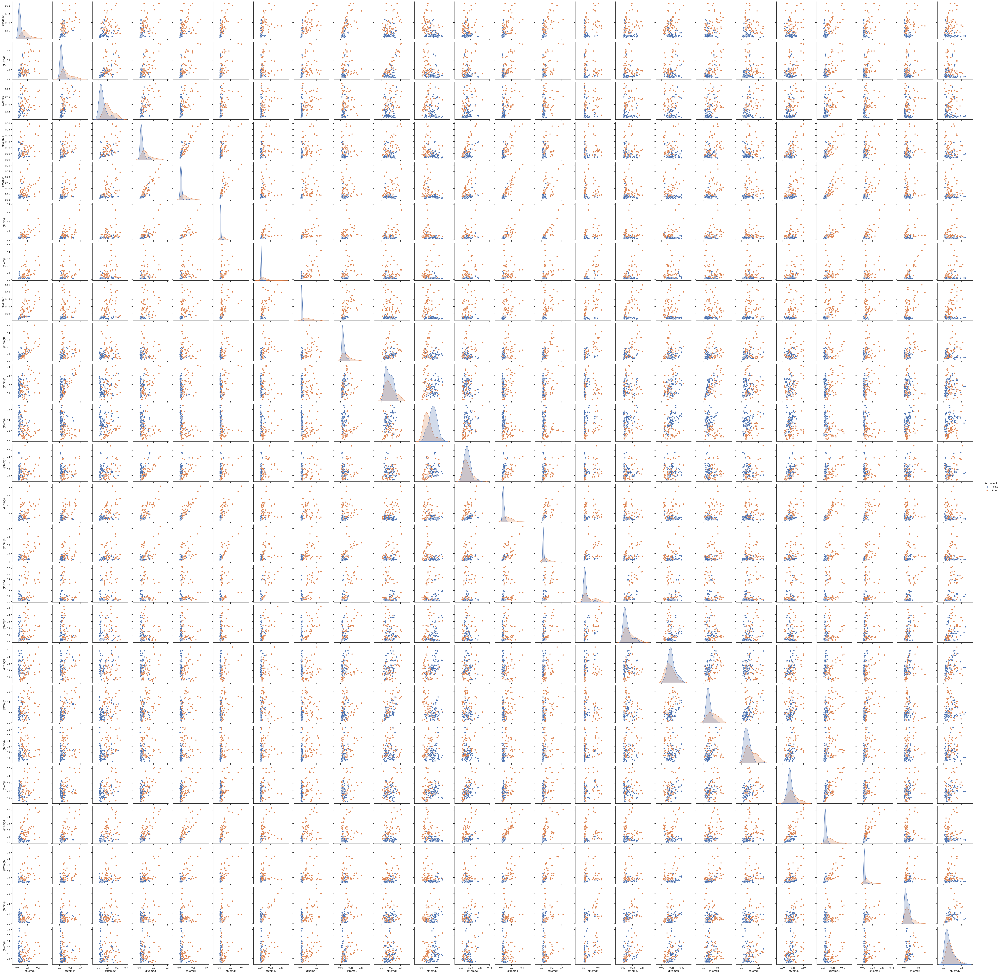

In [9]:
sns.set_theme(style="ticks")
sns.pairplot(df.iloc[:,:26].drop(columns=['hand']), hue='is_patient')

# plost

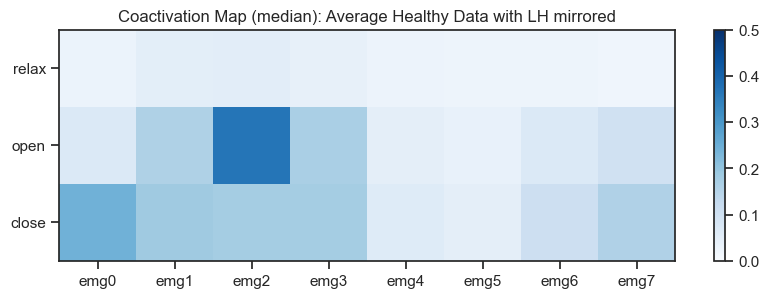

In [10]:
plot_coactivation_map(array_to_cm(df.iloc[:,:24][df.is_patient==False].apply('mean').values), title='Average Healthy Data with LH mirrored')

In [11]:
all_data = df.iloc[:,:24].to_numpy().reshape(1, 121*24)[0]
sum(all_data > 0.5), np.max(df.iloc[:,:24])

(49, 0.704225352112676)

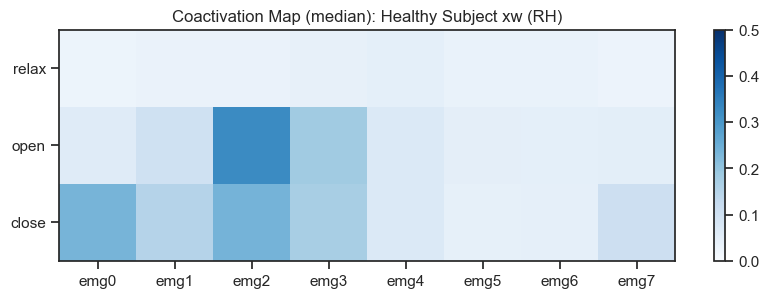

In [12]:
plot_coactivation_map(array_to_cm(df[(df.is_patient==False) & (df.hand=='right')].iloc[3,:24].values).astype(float), title='Healthy Subject xw (RH)')

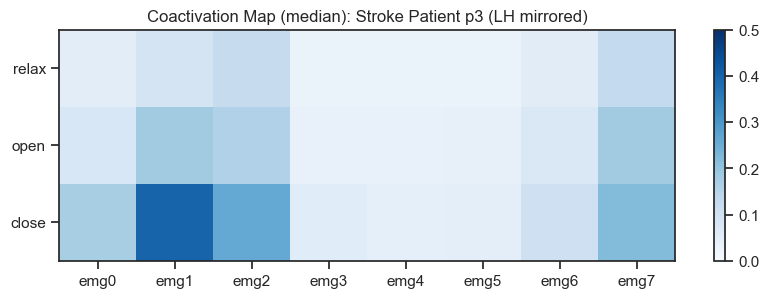

In [13]:
plot_coactivation_map(array_to_cm(df[(df.is_patient==True) & (df.hand=='left')].iloc[3,:24].values).astype(float), title='Stroke Patient p3 (LH mirrored)')


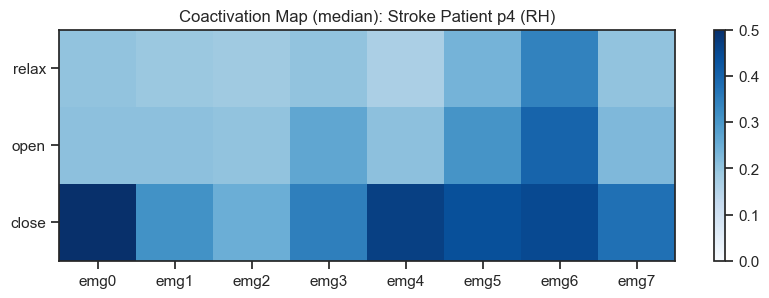

In [14]:
plot_coactivation_map(array_to_cm(df[(df.is_patient==True) & (df.hand=='right')].iloc[3,:24].values).astype(float), title='Stroke Patient p4 (RH)')


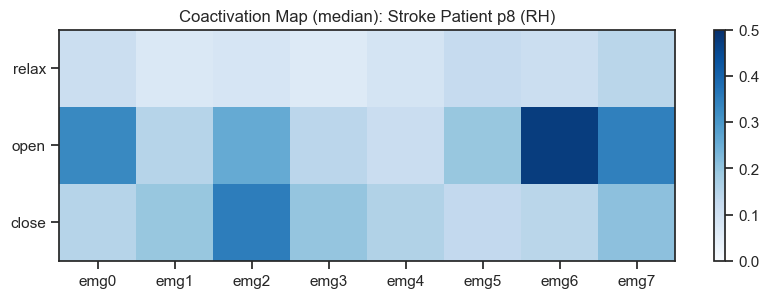

In [15]:
plot_coactivation_map(array_to_cm(df[(df.is_patient==True) & (df.hand=='right')].iloc[19,:24].values).astype(float), title='Stroke Patient p8 (RH)')


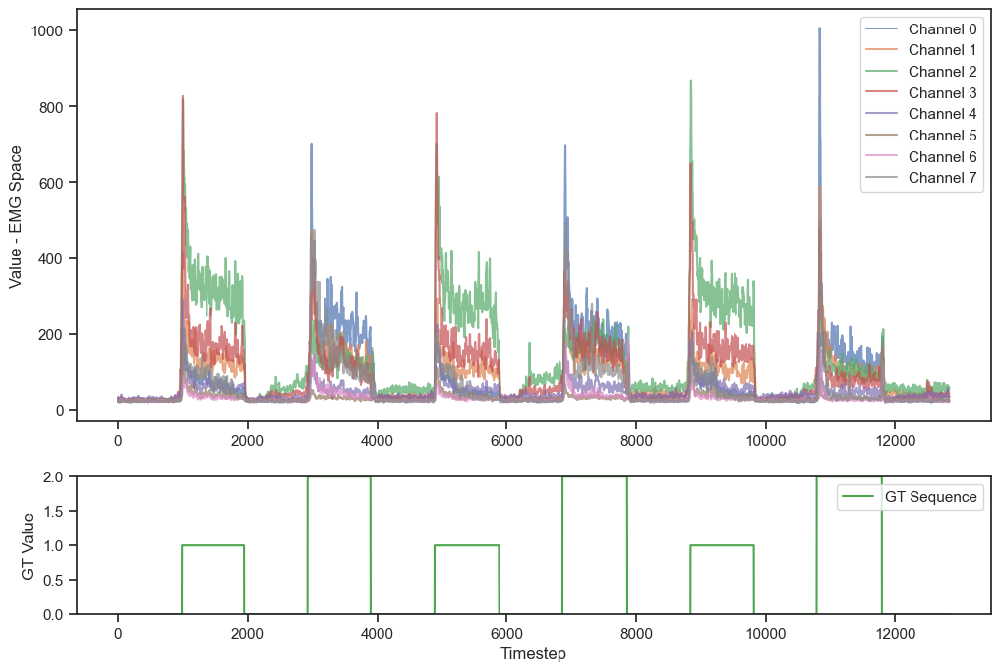

In [16]:
visualize_emgs('collected_data/2023_10_23_xw/xw_131.csv')

# optimal k

## Relax

In [17]:
n_clusters = 2

In [18]:
X = df.iloc[:,:8].values

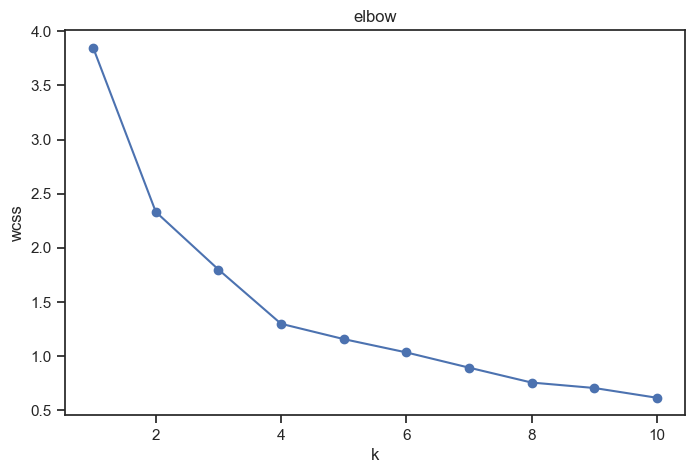

In [19]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

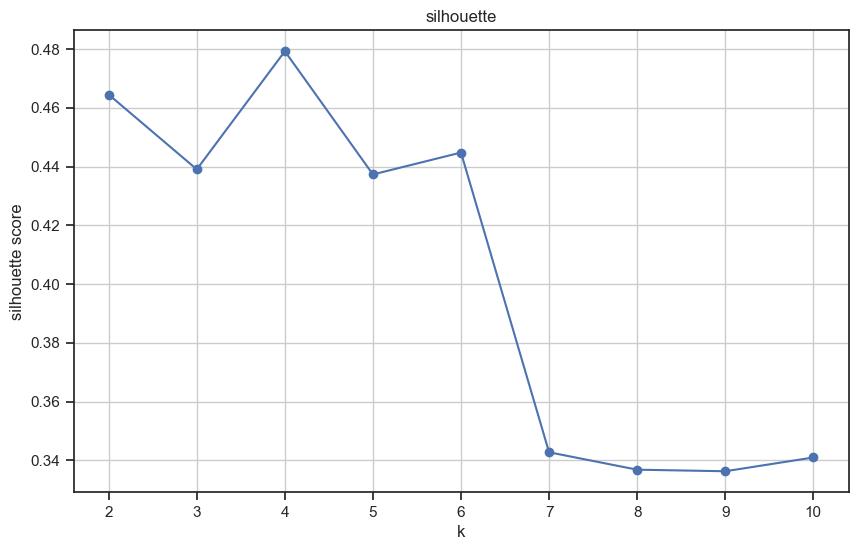

In [20]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [21]:
kmeans = KMeans(n_clusters=4,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df['cluster'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.0351145  0.04443422 0.04688623 0.03737939 0.02911377 0.02476638
  0.02764959 0.02783521]
 [0.0741808  0.17576602 0.13201191 0.11341343 0.1061181  0.06438565
  0.05444226 0.05844818]
 [0.16259985 0.28867532 0.17196026 0.25280054 0.21670516 0.25618176
  0.22283697 0.16081503]
 [0.09502708 0.06569589 0.10893135 0.07079901 0.05669266 0.06202628
  0.22462048 0.15783452]]


In [22]:
def plot_one_class_coactivation_map(coactivation_map, metric='median', title='', label='', cmap='Blues'):
    fig, ax = plt.subplots(figsize=(10,1))
    im = ax.imshow([coactivation_map], cmap=cmap,
                   vmin=0, vmax=0.5)
    ax.set_xticks(np.arange(len(emgs)), labels=emgs)
    ax.set_yticks([0], labels=[label])
    ax.set_title('Coactivation Map (' + metric + '): ' + title)
    fig.colorbar(im, ax=ax)
    return

In [23]:
df['cluster'].value_counts()

cluster
0    75
1    27
3    14
2     5
Name: count, dtype: int64

In [24]:
pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/1772303394.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id)))


,0
cluster,
0,"[ae, as, cl, dy, fa, gk, hr, im, is, jo, jp, p..."
1,"[ac, im, p1, p3, p4, p8]"
2,[p4]
3,"[p3, p7, p8]"


In [25]:
str(pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id))).iloc[1].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/2692373268.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  str(pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id))).iloc[1].to_numpy()).replace("'","")


'[array([ac, im, p1, p3, p4, p8], dtype=object)]'

In [26]:
tsne_input = df.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df['cluster'].to_numpy().astype(str)
data_tsne['subject_ids'] = df['subject_id'].to_numpy()


In [27]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Relax: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('relax.html')

In [28]:
color_map

{'0': 'red', '1': 'blue', '2': 'green', '3': 'purple'}

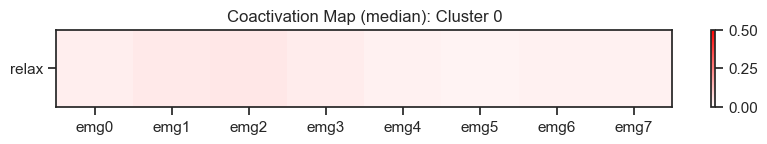

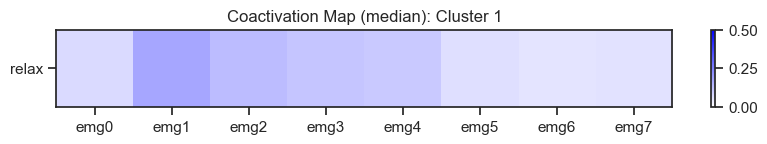

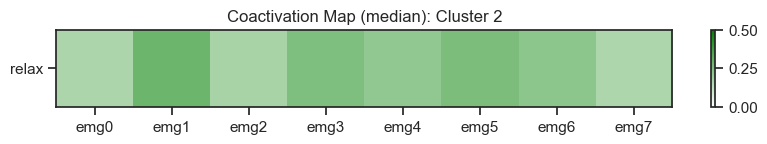

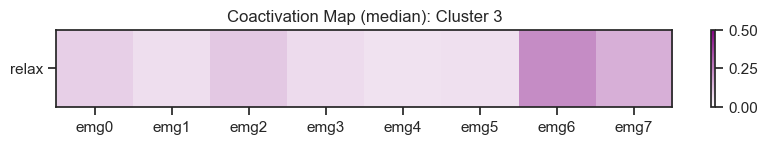

In [29]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='relax', cmap=cmap)

## open

In [30]:
X = df.iloc[:,8:16].values

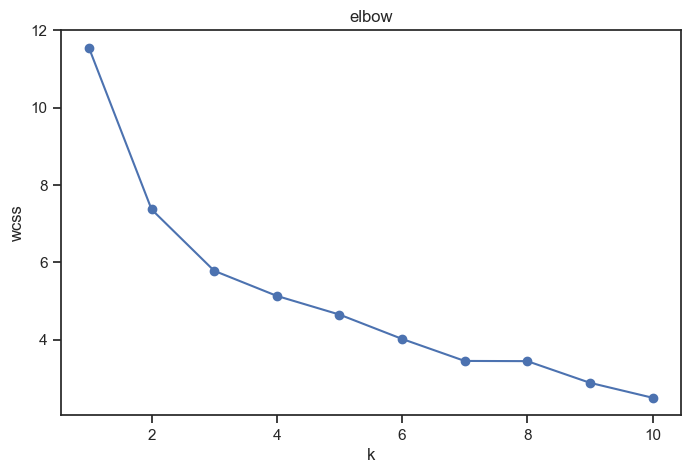

In [31]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

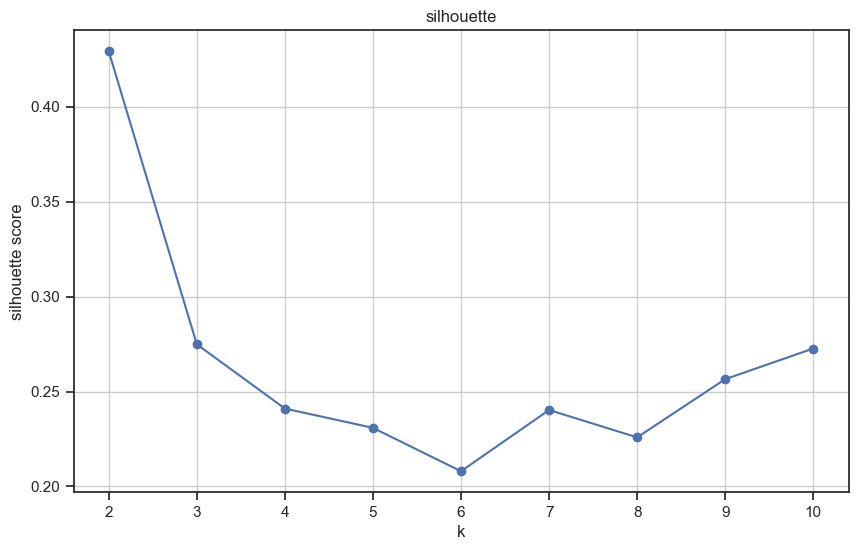

In [32]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [33]:
kmeans = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df['cluster'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.07179422 0.16783648 0.28439311 0.15144209 0.07417021 0.04544827
  0.04846484 0.08166589]
 [0.20192214 0.17686157 0.36728777 0.22395142 0.11660503 0.14112396
  0.38280167 0.28822213]]


In [34]:
df['cluster'].value_counts()

cluster
0    93
1    28
Name: count, dtype: int64

In [35]:
pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/1772303394.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster,
0,"[ac, ae, as, cl, dy, fa, gk, hr, im, is, jo, p..."
1,"[jp, p4, p7, p8, ts]"


In [36]:
# str(pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id))).iloc[2].to_numpy()).replace("'","")

In [37]:
tsne_input = df.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df['cluster'].to_numpy().astype(str)
data_tsne['subject_ids'] = df['subject_id'].to_numpy()


In [38]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Open: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('open.html')

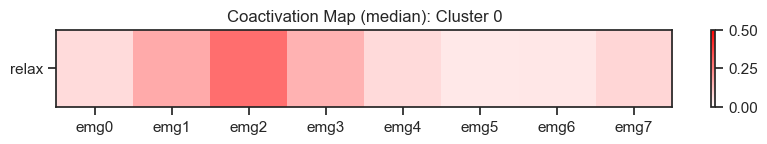

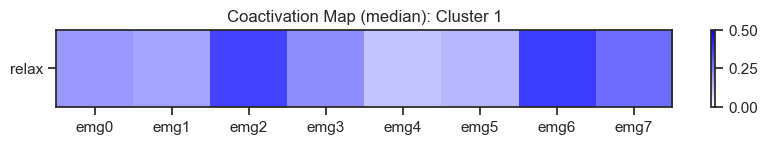

In [39]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='relax', cmap=cmap)

## closed

In [40]:
X = df.iloc[:,16:24].values

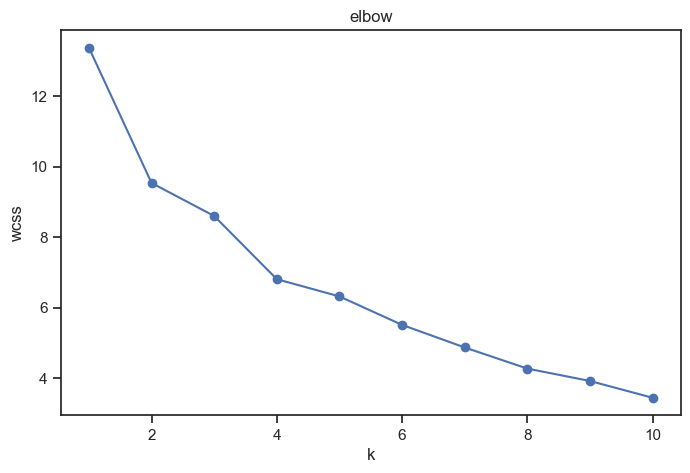

In [41]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

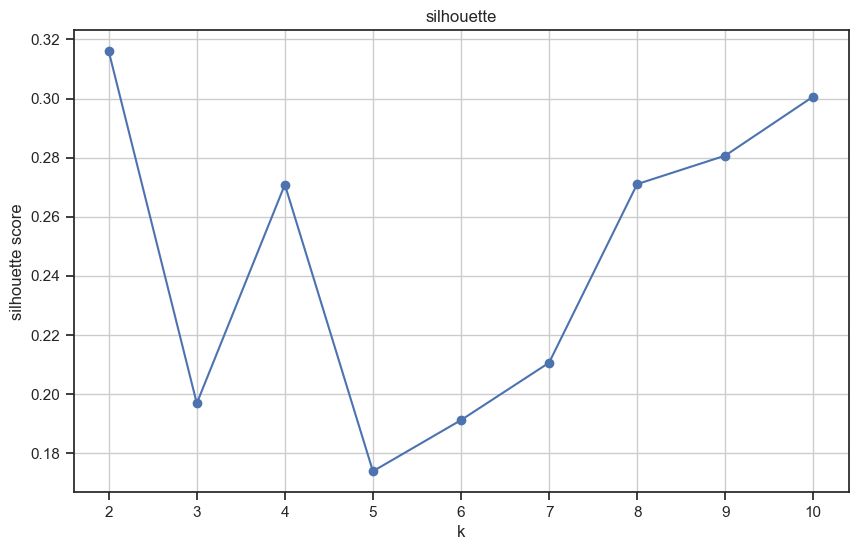

In [42]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [43]:
kmeans = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df['cluster'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.28473507 0.37777288 0.33232207 0.27711854 0.20981636 0.16030145
  0.18389829 0.244483  ]
 [0.19560248 0.1671929  0.16561644 0.16390065 0.07484805 0.05128733
  0.11221219 0.14190063]]


In [44]:
df['cluster'].value_counts()

cluster
1    78
0    43
Name: count, dtype: int64

In [45]:
pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/1772303394.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster,
0,"[ac, jo, p1, p3, p4, p7, p8, ts]"
1,"[ae, as, cl, dy, fa, gk, hr, im, is, jo, jp, p..."


In [46]:
# str(pd.DataFrame(df.groupby('cluster').apply(lambda x: np.unique(x.subject_id))).iloc[2].to_numpy()).replace("'","")

In [47]:
tsne_input = df.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df['cluster'].to_numpy().astype(str)
data_tsne['subject_ids'] = df['subject_id'].to_numpy()


In [48]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Close: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('close.html')

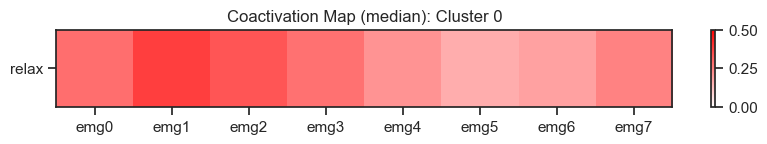

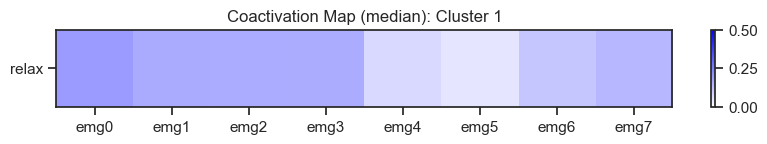

In [49]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='relax', cmap=cmap)

# healthy stratified clusters?

# optimal k

## Relax

In [50]:
df_healthy = df[df.is_patient==False]
df_healthy

,gt0emg0,gt0emg1,gt0emg2,gt0emg3,gt0emg4,gt0emg5,gt0emg6,gt0emg7,gt1emg0,gt1emg1,...,gt2emg3,gt2emg4,gt2emg5,gt2emg6,gt2emg7,hand,is_patient,n,subject_id,cluster
0,0.018537,0.019512,0.021463,0.020488,0.020488,0.020488,0.018537,0.018537,0.074146,0.187317,...,0.212683,0.074146,0.044878,0.049756,0.067317,left,False,11,fa,1
0,0.016559,0.017479,0.019319,0.018399,0.019319,0.019319,0.017479,0.017479,0.057038,0.148114,...,0.148114,0.060718,0.058878,0.087397,0.087397,left,False,11,fa,1
0,0.017350,0.026025,0.033912,0.030757,0.021293,0.018139,0.015773,0.015773,0.037855,0.117508,...,0.170347,0.067823,0.045741,0.064669,0.064274,left,False,13,fa,1
0,0.024476,0.043706,0.059441,0.044580,0.027972,0.023601,0.019231,0.019231,0.042832,0.126748,...,0.198427,0.081294,0.058566,0.088287,0.086538,left,False,13,fa,1
0,0.041379,0.115271,0.056158,0.025616,0.026601,0.026601,0.028571,0.026601,0.073892,0.253202,...,0.138916,0.051232,0.032512,0.040394,0.107389,right,False,11,xw,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.031191,0.056711,0.061437,0.026465,0.032136,0.029301,0.023629,0.022684,0.055766,0.059546,...,0.224953,0.067108,0.040643,0.034972,0.058601,right,False,13,yc,1
0,0.020871,0.023593,0.019964,0.019056,0.018149,0.016334,0.016334,0.016334,0.093466,0.237750,...,0.294011,0.058984,0.031760,0.203267,0.087114,right,False,11,is,1
0,0.022989,0.022031,0.022989,0.057471,0.021073,0.018199,0.017241,0.018199,0.091954,0.235632,...,0.269157,0.052682,0.031609,0.290230,0.178161,right,False,11,is,1
0,0.018700,0.020481,0.028495,0.142476,0.042743,0.031167,0.026714,0.017809,0.033838,0.139804,...,0.238646,0.076581,0.041852,0.118433,0.289403,right,False,13,is,1


In [51]:
n_clusters = 2

In [52]:
X = df_healthy.iloc[:,:8].values

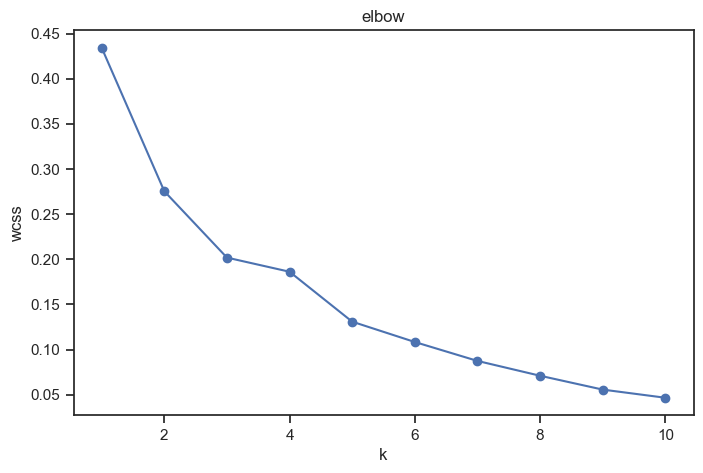

In [53]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

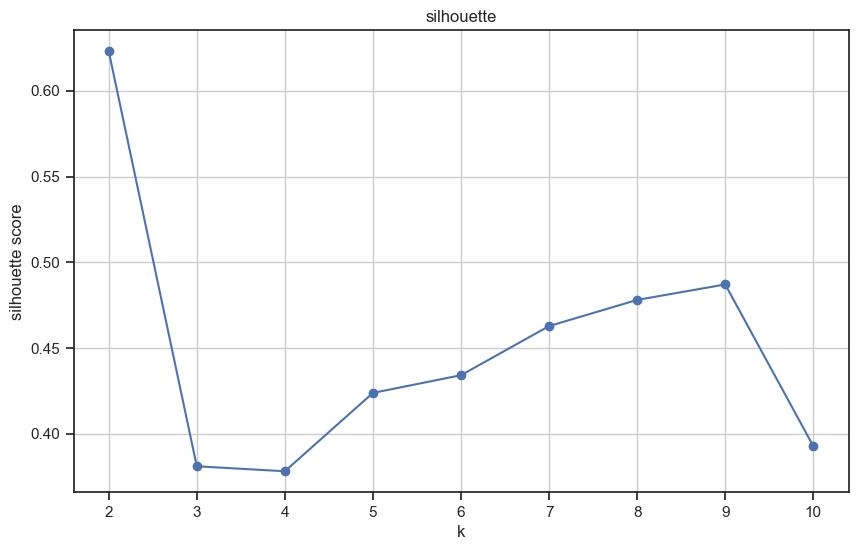

In [54]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [55]:
kmeans = KMeans(n_clusters=2,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_healthy['cluster_relax'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.04272831 0.10433478 0.11452907 0.06224791 0.04031715 0.0294132
  0.02602609 0.02370346]
 [0.02734643 0.03133493 0.03033292 0.03288814 0.02564371 0.02246437
  0.02470253 0.02042133]]


/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3247859939.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [56]:
def plot_one_class_coactivation_map(coactivation_map, metric='median', title='', label='', cmap='Blues'):
    fig, ax = plt.subplots(figsize=(10,1))
    im = ax.imshow([coactivation_map], cmap=cmap,
                   vmin=0, vmax=0.5)
    ax.set_xticks(np.arange(len(emgs)), labels=emgs)
    ax.set_yticks([0], labels=[label])
    ax.set_title('Coactivation Map (' + metric + '): ' + title)
    fig.colorbar(im, ax=ax)
    return

In [57]:
df_healthy['cluster_relax'].value_counts()

cluster_relax
1    52
0    17
Name: count, dtype: int64

In [58]:
pd.DataFrame(df_healthy.groupby('cluster_relax').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/2544935682.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster_relax,
0,"[ac, as, dy, hr, im, jp, xw, yc]"
1,"[ae, as, cl, dy, fa, gk, hr, im, is, jo, jp, s..."


In [59]:
str(pd.DataFrame(df_healthy.groupby('cluster_relax').apply(lambda x: np.unique(x.subject_id))).iloc[1].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/1051671863.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



'[array([ae, as, cl, dy, fa, gk, hr, im, is, jo, jp,\n        si, ts, wx, xw, yc], dtype=object)                     ]'

In [60]:
tsne_input = df_healthy.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df_healthy['cluster_relax'].to_numpy().astype(str)
data_tsne['subject_ids'] = df_healthy['subject_id'].to_numpy()


In [61]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Relax: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('relax.html')

In [62]:
color_map

{'0': 'red', '1': 'blue', '2': 'green', '3': 'purple'}

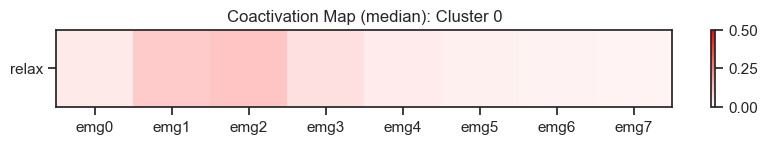

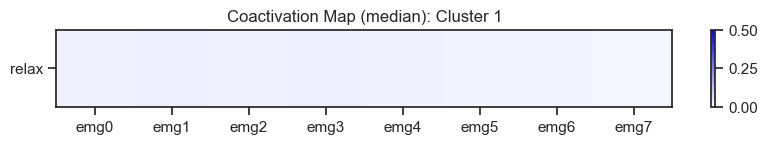

In [63]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='relax', cmap=cmap)

## open

In [64]:
X = df_healthy.iloc[:,8:16].values

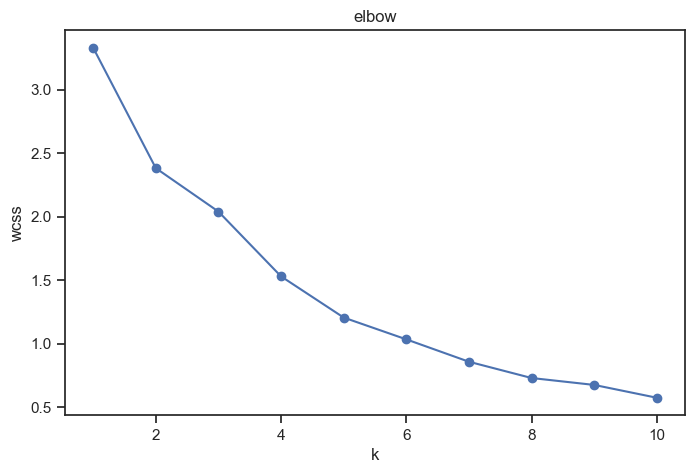

In [65]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

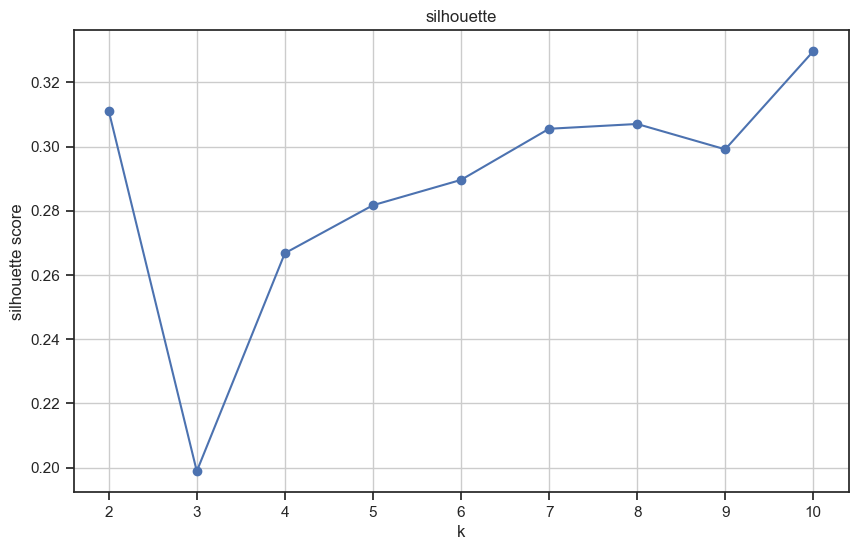

In [66]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [67]:
X = df_healthy.iloc[:,8:16].values
kmeans = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_healthy['cluster_open'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.06325374 0.14607453 0.28836629 0.17865905 0.05113333 0.03486232
  0.0325683  0.05565577]
 [0.0766221  0.18300235 0.48084511 0.15235896 0.04270768 0.0372722
  0.1218387  0.16396348]]


/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/303088958.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [68]:
df_healthy['cluster_open'].value_counts()

cluster_open
0    41
1    28
Name: count, dtype: int64

In [69]:
pd.DataFrame(df_healthy.groupby('cluster_open').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3214834788.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster_open,
0,"[ae, as, cl, dy, fa, gk, hr, im, is, si, wx, x..."
1,"[ac, as, cl, gk, is, jo, jp, ts, wx]"


In [70]:
str(pd.DataFrame(df_healthy.groupby('cluster_open').apply(lambda x: np.unique(x.subject_id))).iloc[0].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/4104431587.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



'[array([ae, as, cl, dy, fa, gk, hr, im, is, si, wx,\n        xw, yc], dtype=object)                                       ]'

In [71]:
tsne_input = df_healthy.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df_healthy['cluster_open'].to_numpy().astype(str)
data_tsne['subject_ids'] = df_healthy['subject_id'].to_numpy()


In [72]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Open: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('open.html')

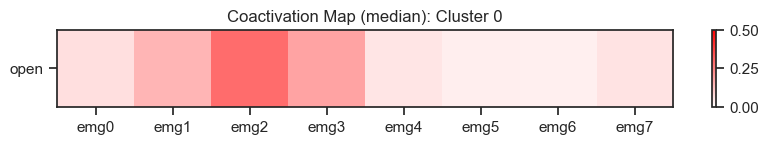

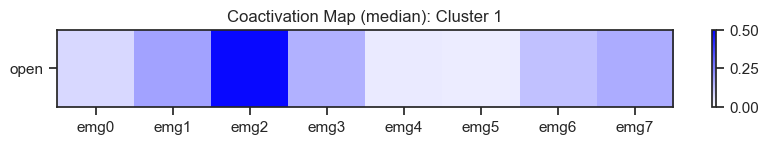

In [73]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='open', cmap=cmap)

## closed

In [74]:
X = df_healthy.iloc[:,16:24].values

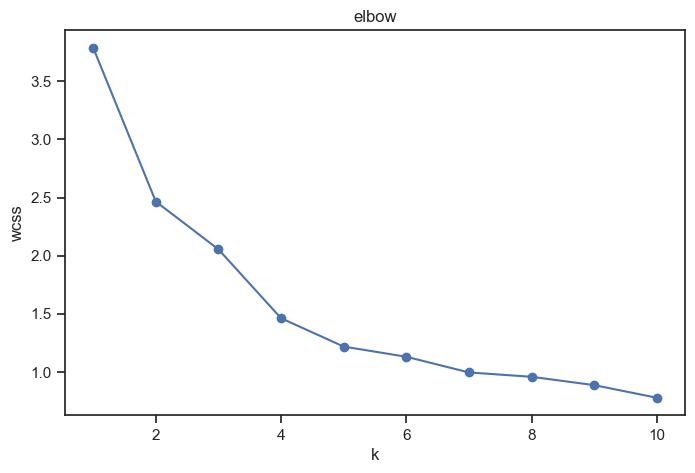

In [75]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

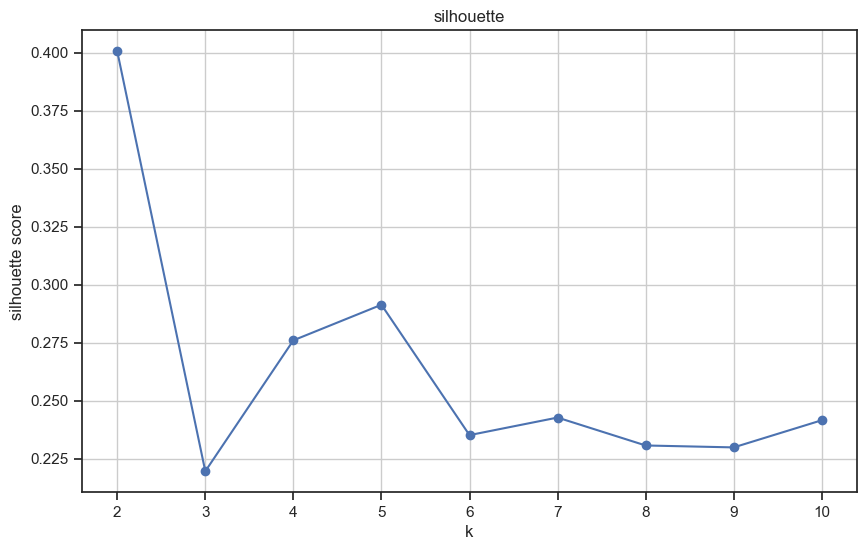

In [76]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [77]:
kmeans = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_healthy['cluster_close'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.21227671 0.15432659 0.15670495 0.16292304 0.05943103 0.04089795
  0.09096234 0.11742486]
 [0.37827696 0.31478111 0.25975412 0.24152664 0.06997599 0.07368537
  0.1694169  0.33905226]]


/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/2759259787.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [78]:
df_healthy['cluster_close'].value_counts()

cluster_close
0    56
1    13
Name: count, dtype: int64

In [79]:
pd.DataFrame(df_healthy.groupby('cluster_close').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3557340323.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster_close,
0,"[ae, as, cl, dy, fa, gk, hr, im, is, jo, jp, s..."
1,"[ac, is, jo, ts, wx]"


In [80]:
str(pd.DataFrame(df_healthy.groupby('cluster_close').apply(lambda x: np.unique(x.subject_id))).iloc[0].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/843054112.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



'[array([ae, as, cl, dy, fa, gk, hr, im, is, jo, jp,\n        si, wx, xw, yc], dtype=object)                           ]'

In [81]:
tsne_input = df_healthy.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df_healthy['cluster_close'].to_numpy().astype(str)
data_tsne['subject_ids'] = df_healthy['subject_id'].to_numpy()


In [82]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Close: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('close.html')

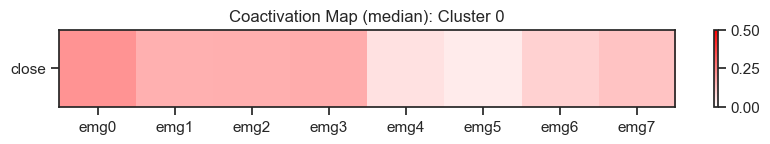

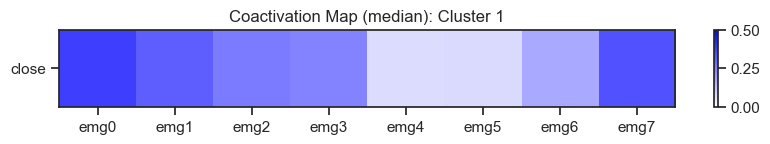

In [83]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='close', cmap=cmap)

# max normalized

In [84]:
df_mn = df_healthy.iloc[:,:24].div(np.max(df_healthy.iloc[:,:24], axis=1), axis='index')


In [85]:
df_mn['hand'] = df_healthy['hand']
df_mn['is_patient'] = df_healthy['is_patient']
df_mn['n'] = df_healthy['n']
df_mn['subject_id'] = df_healthy['subject_id']

## Relax

In [86]:
n_clusters = 2

In [87]:
X = df_mn.iloc[:,:8].values

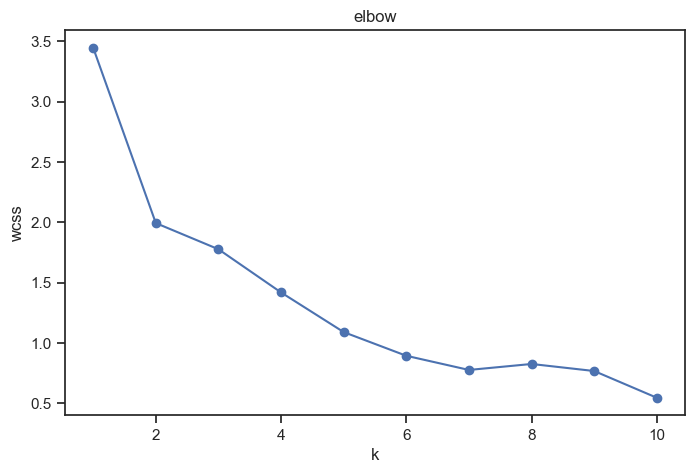

In [88]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

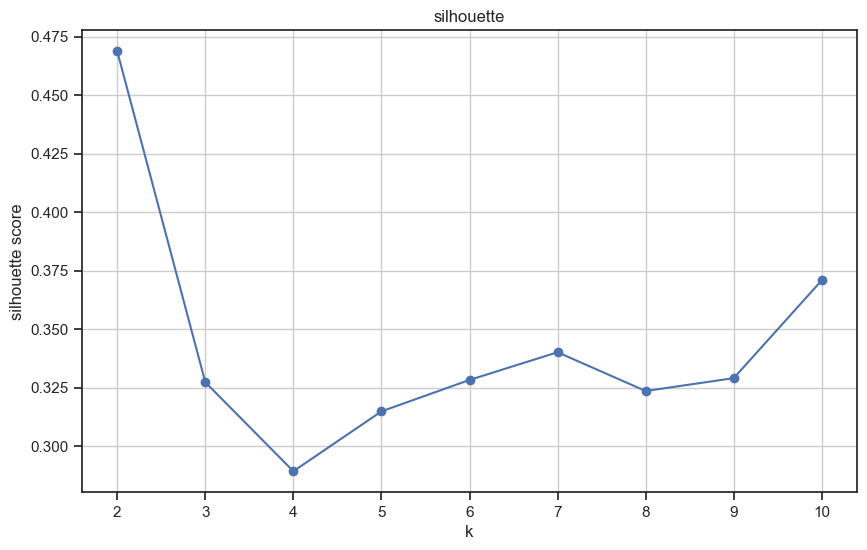

In [89]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [90]:
kmeans = KMeans(n_clusters=2,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_mn['cluster_relax'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.07115008 0.08322351 0.08570138 0.08131508 0.06594678 0.05885452
  0.06414103 0.05375764]
 [0.14202128 0.2849175  0.28842914 0.19408037 0.12964294 0.09281539
  0.08082652 0.0782416 ]]


In [91]:
def plot_one_class_coactivation_map(coactivation_map, metric='median', title='', label='', cmap='Blues'):
    fig, ax = plt.subplots(figsize=(10,1))
    im = ax.imshow([coactivation_map], cmap=cmap,
                   vmin=0, vmax=0.5)
    ax.set_xticks(np.arange(len(emgs)), labels=emgs)
    ax.set_yticks([0], labels=[label])
    ax.set_title('Coactivation Map (' + metric + '): ' + title)
    fig.colorbar(im, ax=ax)
    return

In [92]:
df_mn['cluster_relax'].value_counts()

cluster_relax
0    50
1    19
Name: count, dtype: int64

In [93]:
pd.DataFrame(df_mn.groupby('cluster_relax').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3990477681.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster_relax,
0,"[ae, as, cl, fa, gk, hr, im, is, jo, jp, si, t..."
1,"[ac, ae, as, dy, fa, hr, im, xw, yc]"


In [94]:
str(pd.DataFrame(df_mn.groupby('cluster_relax').apply(lambda x: np.unique(x.subject_id))).iloc[1].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/1942898325.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



'[array([ac, ae, as, dy, fa, hr, im, xw, yc], dtype=object)]'

In [95]:
tsne_input = df_mn.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df_mn['cluster_relax'].to_numpy().astype(str)
data_tsne['subject_ids'] = df_mn['subject_id'].to_numpy()


In [96]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Relax: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('relax.html')

In [97]:
color_map

{'0': 'red', '1': 'blue', '2': 'green', '3': 'purple'}

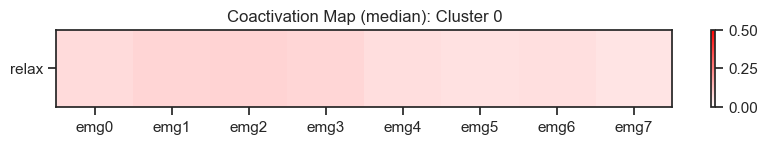

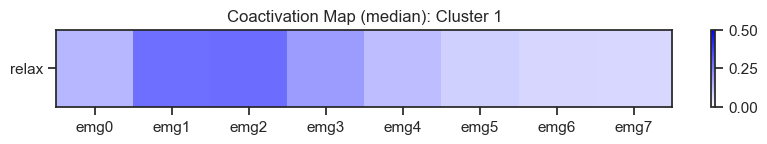

In [98]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='relax', cmap=cmap)

## open

In [99]:
X = df_mn.iloc[:,8:16].values

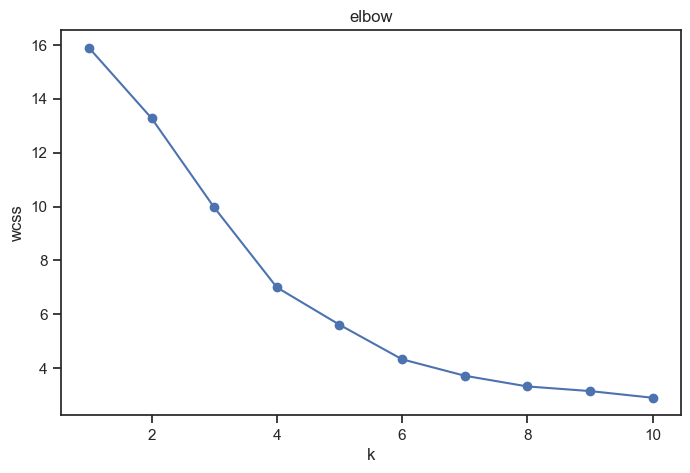

In [100]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

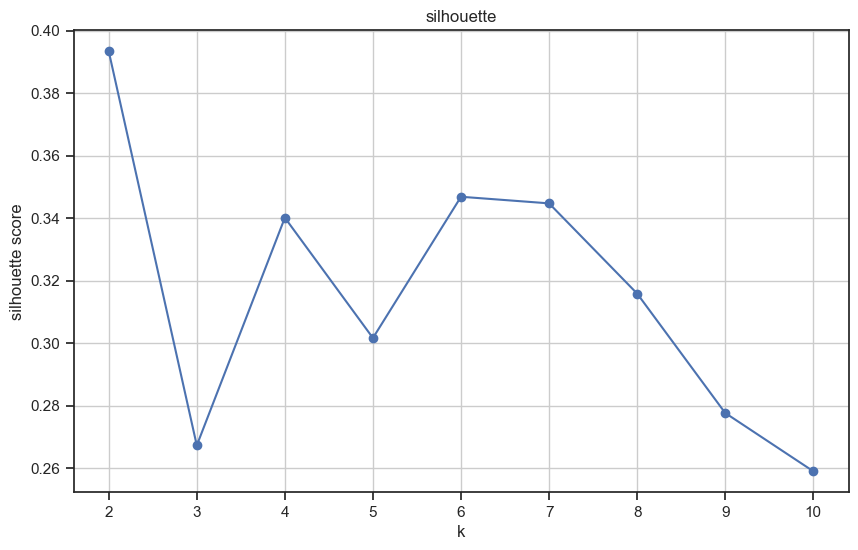

In [101]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [102]:
kmeans = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_mn['cluster_open'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.21014365 0.50095818 0.9097077  0.29679987 0.10351955 0.08883459
  0.22072616 0.32209758]
 [0.1612166  0.37042116 0.95613468 0.66600552 0.17459229 0.11026993
  0.08932528 0.13077275]]


In [103]:
df_mn['cluster_open'].value_counts()

cluster_open
0    40
1    29
Name: count, dtype: int64

In [104]:
pd.DataFrame(df_mn.groupby('cluster_open').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3940457252.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster_open,
0,"[ac, ae, cl, dy, fa, gk, hr, jo, jp, ts, wx]"
1,"[as, cl, dy, im, is, si, xw, yc]"


In [105]:
str(pd.DataFrame(df_mn.groupby('cluster_open').apply(lambda x: np.unique(x.subject_id))).iloc[0].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3312258201.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



'[array([ac, ae, cl, dy, fa, gk, hr, jo, jp, ts, wx],\n       dtype=object)                                                      ]'

In [106]:
tsne_input = df_mn.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df_mn['cluster_open'].to_numpy().astype(str)
data_tsne['subject_ids'] = df_mn['subject_id'].to_numpy()


In [107]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Open: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('open.html')

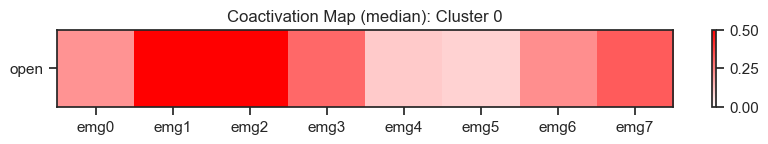

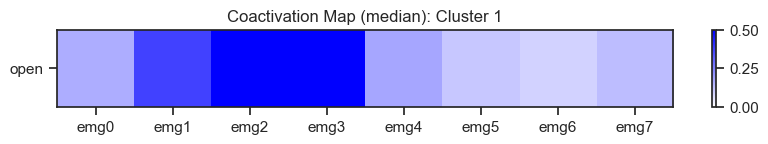

In [108]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='open', cmap=cmap)

## closed

In [109]:
X = df_mn.iloc[:,16:24].values

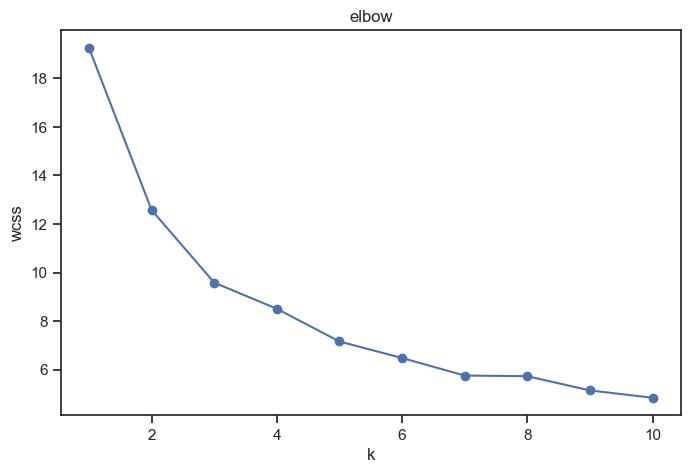

In [110]:
# elbow method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('elbow')
plt.xlabel('k')
plt.ylabel('wcss')
plt.show()

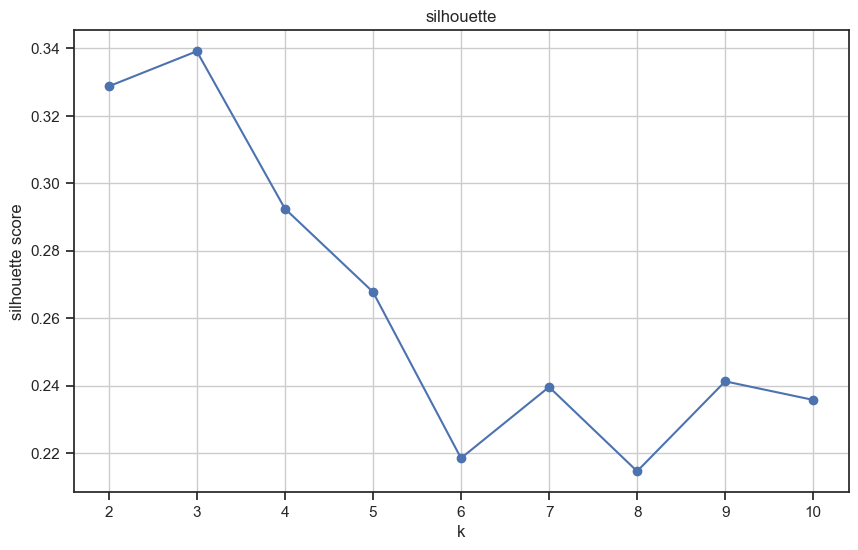

In [111]:
silhouette_scores = []
for k in range(2, 11):  # Silhouette score is not defined for k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('silhouette')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

# k-means

In [112]:
kmeans = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_mn['cluster_close'] = kmeans.fit_predict(X)
kmeans.fit(X)

labels = kmeans.predict(X)

print("Cluster Centers:\n", kmeans.cluster_centers_)

Cluster Centers:
 [[0.87174711 0.76762013 0.68914854 0.66449119 0.25356974 0.18600884
  0.38047967 0.46536816]
 [0.54358248 0.38514652 0.37979812 0.40667451 0.14549888 0.10362377
  0.22293583 0.35938547]]


In [113]:
df_mn['cluster_close'].value_counts()

cluster_close
1    49
0    20
Name: count, dtype: int64

In [114]:
pd.DataFrame(df_mn.groupby('cluster_close').apply(lambda x: np.unique(x.subject_id)))

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3341438722.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,0
cluster_close,
0,"[ac, dy, fa, jo, si, ts]"
1,"[ae, as, cl, gk, hr, im, is, jo, jp, si, wx, x..."


In [115]:
str(pd.DataFrame(df_mn.groupby('cluster_close').apply(lambda x: np.unique(x.subject_id))).iloc[0].to_numpy()).replace("'","")

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/923525623.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



'[array([ac, dy, fa, jo, si, ts], dtype=object)]'

In [116]:
tsne_input = df_mn.iloc[:,:24].to_numpy()
data_tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=3).fit_transform(tsne_input)
data_tsne = pd.DataFrame(data_tsne, columns=['myx', 'myy', 'myz'])
data_tsne['cluster_ids'] = df_mn['cluster_close'].to_numpy().astype(str)
data_tsne['subject_ids'] = df_mn['subject_id'].to_numpy()


In [117]:
unique_clusters = sorted(data_tsne['cluster_ids'].unique())
# palette = px.colors.qualitative.Plotly 
color_map = {
    "0": "red",   
    "1": "blue",   
    "2": "green",  
    "3": "purple" 
}

# color_map = {str(cluster): palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

fig = px.scatter_3d(data_tsne,
                    x='myx', y='myy', z='myz',
                    color='cluster_ids',
                    text='subject_ids',
                    title='Close: 3D t-SNE for K-means', 
                    color_discrete_map=color_map,
                    category_orders={'cluster_ids': unique_clusters},
)
fig.update_layout(
    legend=dict(
        x=1.15,
        y=0.5, 
        xanchor='left',
        yanchor='middle' 
    )
)

fig.show()
fig.write_html('close.html')

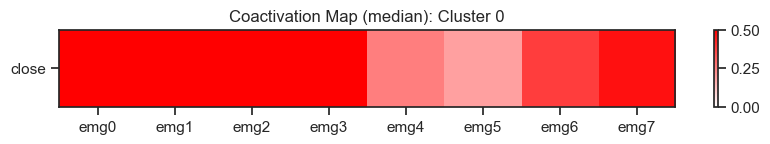

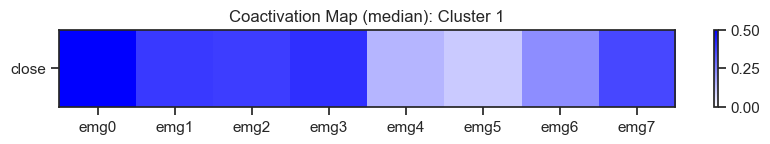

In [118]:
for i in range(len(kmeans.cluster_centers_)):
    cmap = LinearSegmentedColormap.from_list("white_to_color", ["white", color_map[str(i)]])
    cluster_center = kmeans.cluster_centers_[i]
    plot_one_class_coactivation_map(cluster_center, title='Cluster ' + str(i), label='close', cmap=cmap)

# exploration

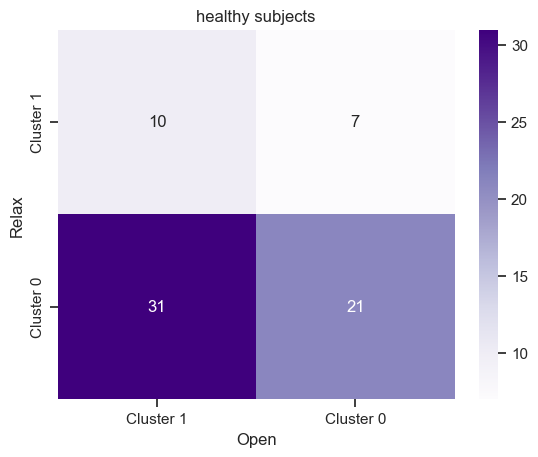

In [147]:
import seaborn as sns
cm = confusion_matrix(df_healthy['cluster_relax'], df_healthy['cluster_open'])
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples", xticklabels=["Cluster 1", "Cluster 0"], yticklabels=["Cluster 1", "Cluster 0"])
plt.xlabel("Open")
plt.ylabel("Relax")
plt.title('healthy subjects')
plt.show()

In [119]:
df

,gt0emg0,gt0emg1,gt0emg2,gt0emg3,gt0emg4,gt0emg5,gt0emg6,gt0emg7,gt1emg0,gt1emg1,...,gt2emg3,gt2emg4,gt2emg5,gt2emg6,gt2emg7,hand,is_patient,n,subject_id,cluster
0,0.018537,0.019512,0.021463,0.020488,0.020488,0.020488,0.018537,0.018537,0.074146,0.187317,...,0.212683,0.074146,0.044878,0.049756,0.067317,left,False,11,fa,1
0,0.016559,0.017479,0.019319,0.018399,0.019319,0.019319,0.017479,0.017479,0.057038,0.148114,...,0.148114,0.060718,0.058878,0.087397,0.087397,left,False,11,fa,1
0,0.017350,0.026025,0.033912,0.030757,0.021293,0.018139,0.015773,0.015773,0.037855,0.117508,...,0.170347,0.067823,0.045741,0.064669,0.064274,left,False,13,fa,1
0,0.024476,0.043706,0.059441,0.044580,0.027972,0.023601,0.019231,0.019231,0.042832,0.126748,...,0.198427,0.081294,0.058566,0.088287,0.086538,left,False,13,fa,1
0,0.041379,0.115271,0.056158,0.025616,0.026601,0.026601,0.028571,0.026601,0.073892,0.253202,...,0.138916,0.051232,0.032512,0.040394,0.107389,right,False,11,xw,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.031191,0.056711,0.061437,0.026465,0.032136,0.029301,0.023629,0.022684,0.055766,0.059546,...,0.224953,0.067108,0.040643,0.034972,0.058601,right,False,13,yc,1
0,0.020871,0.023593,0.019964,0.019056,0.018149,0.016334,0.016334,0.016334,0.093466,0.237750,...,0.294011,0.058984,0.031760,0.203267,0.087114,right,False,11,is,1
0,0.022989,0.022031,0.022989,0.057471,0.021073,0.018199,0.017241,0.018199,0.091954,0.235632,...,0.269157,0.052682,0.031609,0.290230,0.178161,right,False,11,is,1
0,0.018700,0.020481,0.028495,0.142476,0.042743,0.031167,0.026714,0.017809,0.033838,0.139804,...,0.238646,0.076581,0.041852,0.118433,0.289403,right,False,13,is,1


In [148]:
X = df_healthy.iloc[:,8:16].values
kmeans_relax = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_healthy['cluster_open'] = kmeans.fit_predict(X)
kmeans_relax.fit(X)

labels = kmeans_relax.predict(X)

print("Cluster Centers:\n", kmeans_relax.cluster_centers_)

Cluster Centers:
 [[0.06325374 0.14607453 0.28836629 0.17865905 0.05113333 0.03486232
  0.0325683  0.05565577]
 [0.0766221  0.18300235 0.48084511 0.15235896 0.04270768 0.0372722
  0.1218387  0.16396348]]


/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/4065640033.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [149]:
X = df_healthy.iloc[:,8:16].values
kmeans_open = KMeans(n_clusters=n_clusters,         # Number of clusters
                 init='k-means++',    # Centroid initialization
                 max_iter=300,        # Maximum iterations
                 n_init=10,           # Number of initializations
                 tol=1e-4,    
                 random_state=42,    
                 algorithm='lloyd')
df_healthy['cluster_open'] = kmeans_open.fit_predict(X)
kmeans_open.fit(X)

labels = kmeans_open.predict(X)

print("Cluster Centers:\n", kmeans_open.cluster_centers_)

Cluster Centers:
 [[0.06325374 0.14607453 0.28836629 0.17865905 0.05113333 0.03486232
  0.0325683  0.05565577]
 [0.0766221  0.18300235 0.48084511 0.15235896 0.04270768 0.0372722
  0.1218387  0.16396348]]


/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/424518852.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [125]:
df_patient = df[df.is_patient==True]
df_patient['cluster_relax'] = kmeans_relax.fit_predict(df_patient.iloc[:,:8])
df_patient['cluster_open'] = kmeans_open.fit_predict(df_patient.iloc[:,8:16])

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3004580088.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/yd/vqpl9gqn5nqfzr41g9_g0t940000gq/T/ipykernel_3068/3004580088.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
df_patient

,gt0emg0,gt0emg1,gt0emg2,gt0emg3,gt0emg4,gt0emg5,gt0emg6,gt0emg7,gt1emg0,gt1emg1,...,gt2emg5,gt2emg6,gt2emg7,hand,is_patient,n,subject_id,cluster,cluster_relax,cluster_open
0,0.047703,0.102473,0.116608,0.125442,0.088339,0.058304,0.045936,0.054770,0.065371,0.302120,...,0.100707,0.090106,0.199647,left,True,13,p3,0,0,0
0,0.056000,0.073333,0.068000,0.036000,0.036000,0.034667,0.033333,0.048000,0.065333,0.125333,...,0.062667,0.069333,0.134667,left,True,11,p3,1,0,0
0,0.034595,0.114595,0.069189,0.188108,0.165405,0.054054,0.044324,0.041081,0.035676,0.227027,...,0.072432,0.068649,0.063784,right,True,13,p1,1,0,0
0,0.070461,0.279133,0.184282,0.200542,0.189702,0.086721,0.070461,0.065041,0.067751,0.300813,...,0.116531,0.075881,0.067751,right,True,11,p1,0,0,0
0,0.214286,0.300000,0.192857,0.278571,0.192857,0.171429,0.214286,0.164286,0.235714,0.328571,...,0.292857,0.350000,0.314286,right,True,11,p4,0,1,1
0,0.202312,0.190751,0.184971,0.202312,0.167630,0.236994,0.341040,0.202312,0.208092,0.208092,...,0.439306,0.450867,0.375723,right,True,11,p4,0,1,1
0,0.176166,0.196891,0.145078,0.212435,0.139896,0.139896,0.274611,0.176166,0.279793,0.264249,...,0.404145,0.373057,0.373057,right,True,12,p4,0,1,1
0,0.094094,0.031031,0.031031,0.042042,0.031031,0.040040,0.062062,0.033033,0.095095,0.031031,...,0.095095,0.096096,0.074074,right,True,12,p4,1,0,0
0,0.100917,0.380734,0.183486,0.275229,0.270642,0.334862,0.142202,0.119266,0.137615,0.417431,...,0.431193,0.188073,0.220183,right,True,13,p4,0,1,0
0,0.119318,0.375000,0.153409,0.295455,0.312500,0.397727,0.142045,0.142045,0.153409,0.403409,...,0.568182,0.187500,0.267045,right,True,13,p4,0,1,0


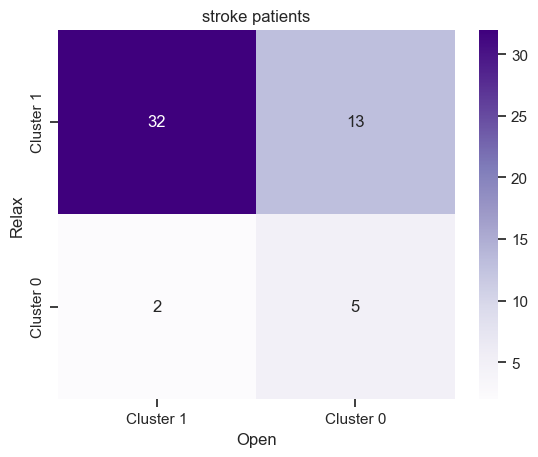

In [132]:
import seaborn as sns
cm = confusion_matrix(df_patient['cluster_relax'], df_patient['cluster_open'])
sns.heatmap(cm, annot=True, fmt="d", cmap="Purples", xticklabels=["Cluster 1", "Cluster 0"], yticklabels=["Cluster 1", "Cluster 0"])
plt.xlabel("Open")
plt.ylabel("Relax")
plt.title('stroke patients')
plt.show()

In [139]:
example_input = df_patient.iloc[10,:24].astype(float).values
example_input

array([0.21478382, 0.05718271, 0.08577406, 0.06834031, 0.06973501,
       0.09065551, 0.21199442, 0.15062762, 0.31799163, 0.10181311,
       0.21478382, 0.09205021, 0.07949791, 0.21896792, 0.51743375,
       0.23430962, 0.17852162, 0.15062762, 0.15550907, 0.11157601,
       0.08786611, 0.08298466, 0.09902371, 0.18549512])

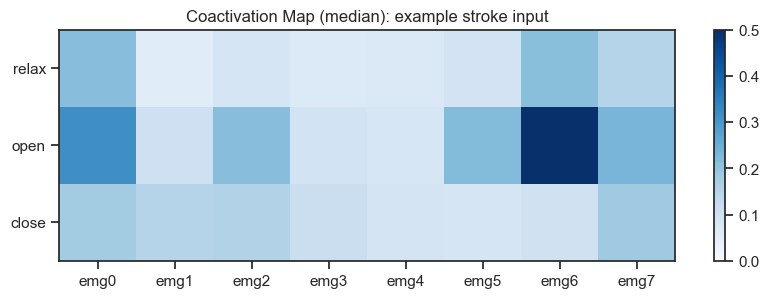

In [141]:
plot_coactivation_map(array_to_cm(example_input), title='example stroke input')

In [153]:
cluster_relax = kmeans_relax.predict(example_input[0:8].reshape(1,-1))[0]
cluster_open = kmeans_open.predict(example_input[8:16].reshape(1,-1))[0]
cluster_relax, cluster_open

(0, 1)